# Introduction

In this tutorial, we demonstrate how to leverage the multi-scale results of SpatialZoomer to **identify spatially dependent clusters**. 

As the spatial scale increases, SpatialZoomer progressively integrates spatial context from broader neighborhoods into each cell’s transcriptomic profile, enabling cells from a single cluster at scale 0 to separate into spatially dependent subclusters at larger scales. These spatial contexts can amplify transcriptomic heterogeneity between biologically distinct subtypes.

Here, we use the **Xenium v1 human lung cancer sample** as an example. This tutorial can be completed on a standard personal computer in approximately 3 minutes.

In [1]:
import warnings
warnings.filterwarnings("ignore")

# Load packages
import spatialzoomer as sz
import scanpy as sc
import numpy as np
import os
import matplotlib.pyplot as plt

# Set figure parameters
plt.rcParams.update({
    "font.family":'sans-serif',
    "mathtext.fontset":'stix',
    "font.size": 7,
    'pdf.fonttype': 42,
    })
sc.set_figure_params(dpi=150)

### 0. Load multi-scale analysis results processed by SpatialZoomer

Please set the following basic information:

* `runLabel`: The name of dataset.  

* `save_path`: A path to save the analysis results.

* `adata`: An **AnnData** object containing multi-scale analysis results from SpatialZoomer, including:  

  - Clustering results: `adata.obs['leiden_<scale>_res<resolution>']`  
  
  - UMAP embeddings: `adata.obsm['X_umap_<scale>']`

**Note**: The input `adata` in this tutorial comes from the multi-scale analysis results of SpatialZoomer.

You may first run `Tutorial1_Xenium_Lung_Cancer_Multi-scale_Analysis.ipynb` to generate the file `<runLabel>_SpatialZoomer.h5ad` with SpatialZoomer and then load it here.

Alternatively, if you have not run `SpatialZoomer` in advance, the processed AnnData object adata used in this tutorial can be directly downloaded from [Google Cloud](https://drive.google.com/file/d/1ZOLHmHFq3T2L670kCJDoMiezvDplJ0yF/view?usp=drive_link). 

In [2]:
runLabel = 'Xenium_Lung_Cancer'
save_path = 'E:/SpatialZoomer/Results/' + runLabel+'_Subclusters/'
os.makedirs(save_path, exist_ok=True)

adata = sc.read_h5ad("E:/SpatialZoomer/Data/Xenium_Lung_Cancer_SpatialZoomer.h5ad")
adata

AnnData object with n_obs × n_vars = 149195 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'Kmeans_Raw', 'leiden_Raw_res0.4', 'leiden_Raw_res0.6', 'leiden_Raw_res0.8', 'leiden_Raw_res1', 'leiden_Raw_res1.2', 'Kmeans_scale0.01', 'leiden_scale0.01_res0.4', 'leiden_scale0.01_res0.6', 'leiden_scale0.01_res0.8', 'leiden_scale0.01_res1', 'leiden_scale0.01_res1.2', 'Kmeans_scale1.0', 'leiden_scale1.0_res0.4', 'leiden_scale1.0_res0.6', 'leiden_scale1.0_res0.8', 'leiden_scale1.0_res1', 'leiden_scale1.0_res1.2', 'Kmeans_scale2.5', 'leiden_scale2.5_res0.4', 'leiden_scale2.5_res0.6', 'leiden_s

In the raw signal space (single-cell scale), cell types were manually assigned using differentially expressed genes(DEGs) from `leiden_Raw_res<resolution>` and known marker genes.

- If you are using the dataset downloaded from Google Cloud: 
    Please run the following annotation and analysis steps to reproduce the results.

- If you are using the AnnData object generated by running SpatialZoomer yourself:
    It is recommended to directly use `leiden_Raw_res1` for downstream analyses, rather than running the following annotation step.
    
    Note that clustering results may show slight variations across different devices and environments, since NMF, Leiden, and UMAP involve stochastic processes, even though random seeds are set.

In [3]:
adata.obs['Cell_Type'] = adata.obs['leiden_Raw_res1'].copy()
new_cluster_names = [
    "AT2_CYP2B6", # 0
    "Basal Epithelial", # 1
    "T", # 2
    "AT2_SFTA2", # 3
    "CAF", # 4
    "Macrophage", # 5
    "Secretory Epithelial", # 6
    "Endothelial",  # 7
    "Plasma", # 8
    "Smooth Muscle", # 9
    "Mast", # 10
    "Ciliated" #11
]
adata.rename_categories("Cell_Type", new_cluster_names)
adata

AnnData object with n_obs × n_vars = 149195 × 377
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'Kmeans_Raw', 'leiden_Raw_res0.4', 'leiden_Raw_res0.6', 'leiden_Raw_res0.8', 'leiden_Raw_res1', 'leiden_Raw_res1.2', 'Kmeans_scale0.01', 'leiden_scale0.01_res0.4', 'leiden_scale0.01_res0.6', 'leiden_scale0.01_res0.8', 'leiden_scale0.01_res1', 'leiden_scale0.01_res1.2', 'Kmeans_scale1.0', 'leiden_scale1.0_res0.4', 'leiden_scale1.0_res0.6', 'leiden_scale1.0_res0.8', 'leiden_scale1.0_res1', 'leiden_scale1.0_res1.2', 'Kmeans_scale2.5', 'leiden_scale2.5_res0.4', 'leiden_scale2.5_res0.6', 'leiden_s

### 1. Identify spatially dependent subclusters

Spatially dependent subclusters are defined as cells that form a single cluster in the raw UMAP space (e.g., a cell type) but progressively separate into distinct subclusters as the spatial scale increases.  

To identify such clusters, we calculate a **variance–scale curve** for each cluster by measuring its variance across normalized UMAP embeddings at different scales. The **slope** of this curve quantifies spatial dependency and is used to rank clusters.  


* `cluster_key`: Specifies the cluster labels in the raw signal space used to assess the spatial dependency of each cluster. It can be set to `leiden_Raw_res<resolution>`, or to annotated cell types if prior biological labels are available.

In [ ]:
# Initialize the object
subcluster_analyzer = sz.SubclusterAnalysis(adata, save_path, cluster_key="Cell_Type") # or use "leiden_Raw_res1", "leiden_Raw_res0.8", ...

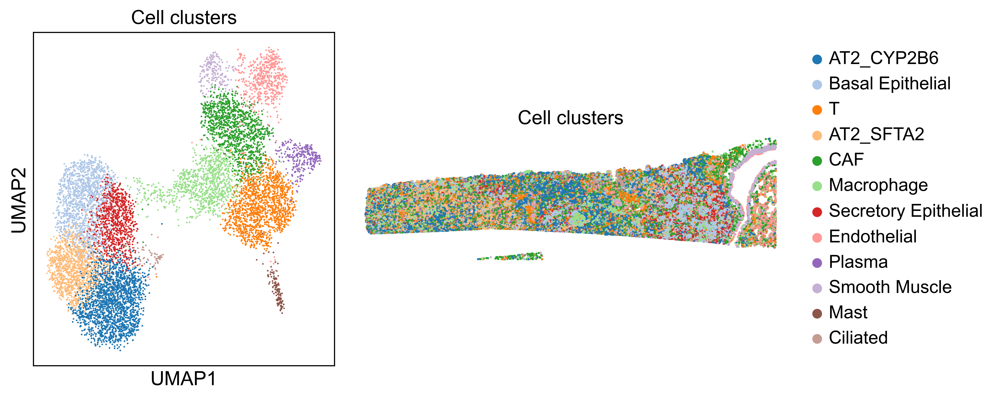

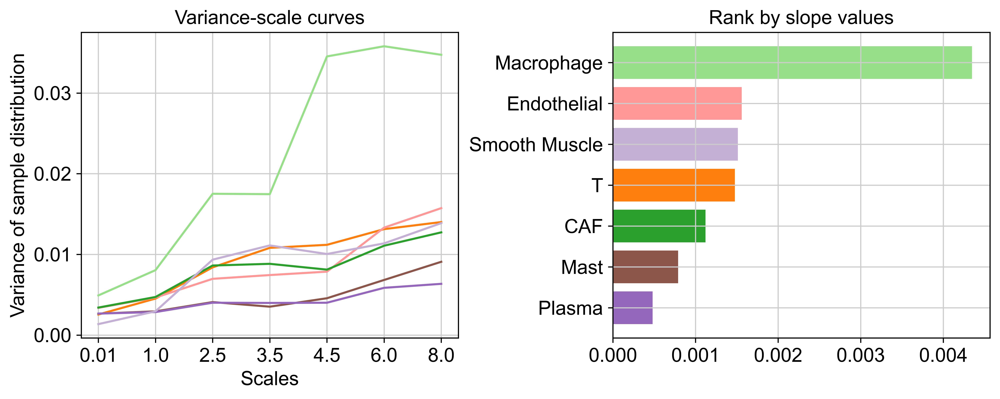

Suggested cluster:  Macrophage


In [5]:
# Calculate variance–scale curves for cell types (non-epithelial cells) and rank them by slopes of their curves
subcluster_analyzer.calculate_metrics(nonepi=True)

### 2. Select a spatially dependent cluster for analysis  

From the ranked results, choose one of the top spatially dependent clusters of interest.  

Visualize its distribution across UMAP embeddings at different scales, and use **Kernel Density Estimation (KDE)** to highlight density patterns within the cluster.


Selected cluster: Macrophage


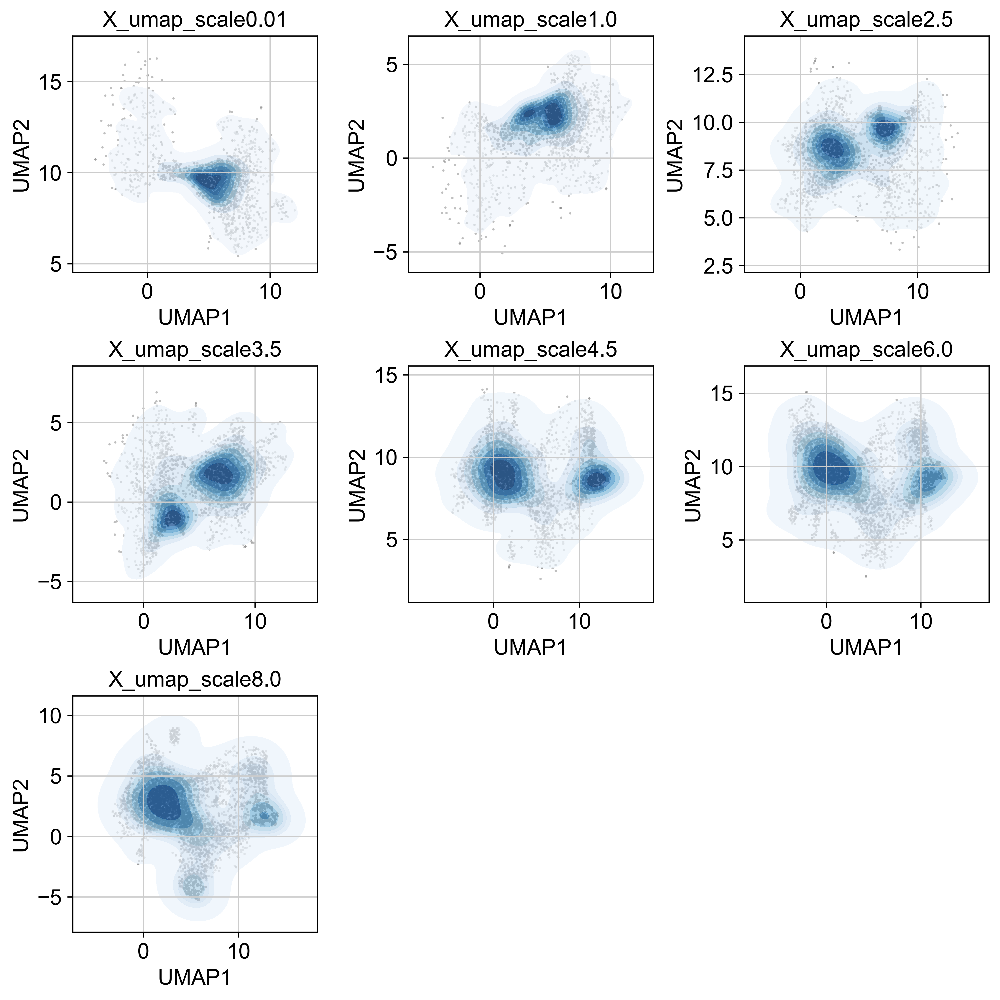

In [ ]:
# Select a top-ranked cluster (must match one of the labels in `cluster_key`) for downstream analysis
subcluster_analyzer.selected_cluster = "Macrophage"

subcluster_analyzer.kde_plot()

### 3. Identify the critical separation scale

For the selected cluster, we apply the Elbow method to its variance–scale curve to determine the critical separation scale.

This separation scale will then be used for identifying spatially dependent subclusters.

In [7]:
subcluster_analyzer.find_optimal_scale()

Optimal scale for cluster Macrophage is 4.5


### 4. Identify subclusters at the critical separation scale  

At the suggested or a user-defined scale, subclusters are identified using the **CFSFDP (Clustering by Fast Search and Find of Density Peaks)** algorithm.  

This density-based method can either adaptively determine the number of clusters or accept a user-specified value.  

It assigns cells into distinct subclusters and designates outliers as `-1`, corresponding to cells lying outside the main density distribution. For subsequent analyses, cells labeled as `-1` are removed.

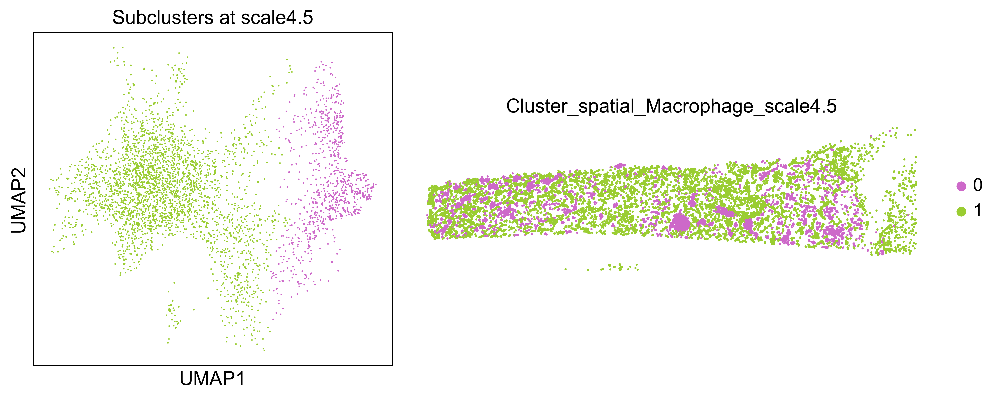

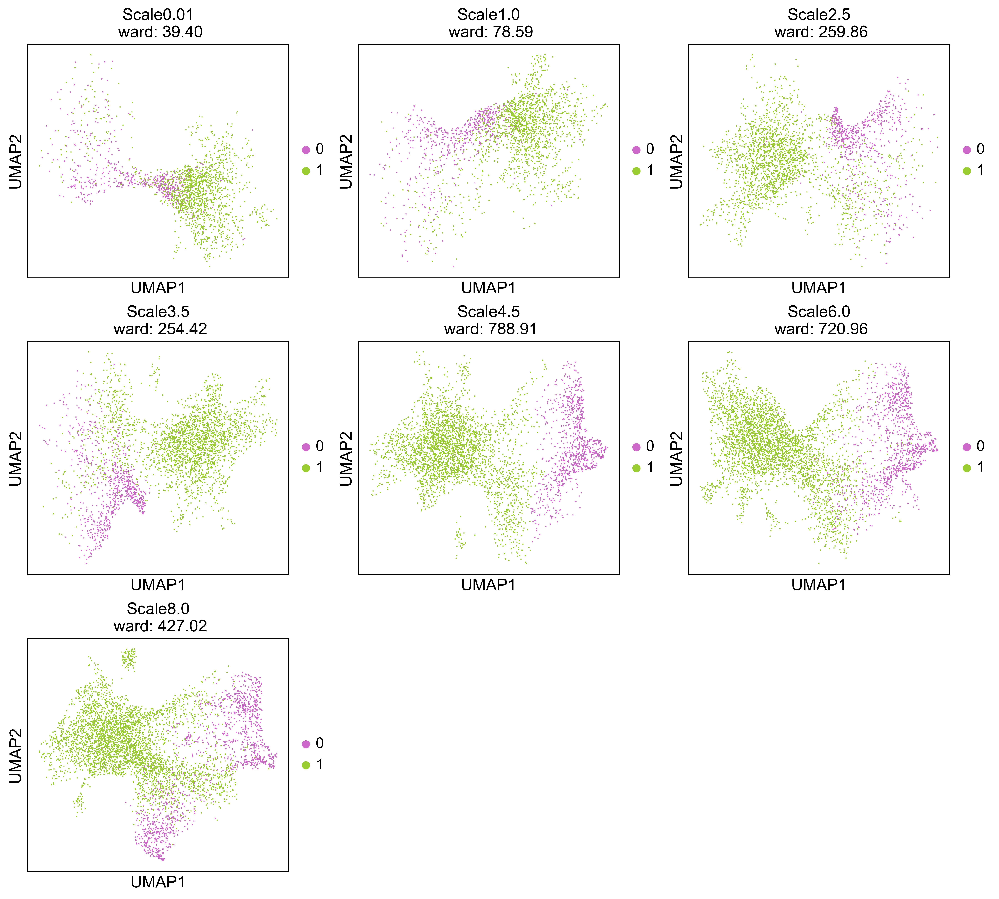

In [8]:
# Manually set the critical separation scale by modifying subcluster_analyzer.optimal_scale,
# otherwise the suggested scale will be used
subcluster_analyzer.detect_subclusters(n_clusters=2, plot_all_scales=True, calculate_ward=True, plot_spatial=True)

### 5. Downstream analysis

After identifying subclusters, we analyze their biological characteristics by comparing transcriptomic profiles and spatial neighborhood composition.

saving DEG results for subcluster 0
saving DEG results for subcluster 1


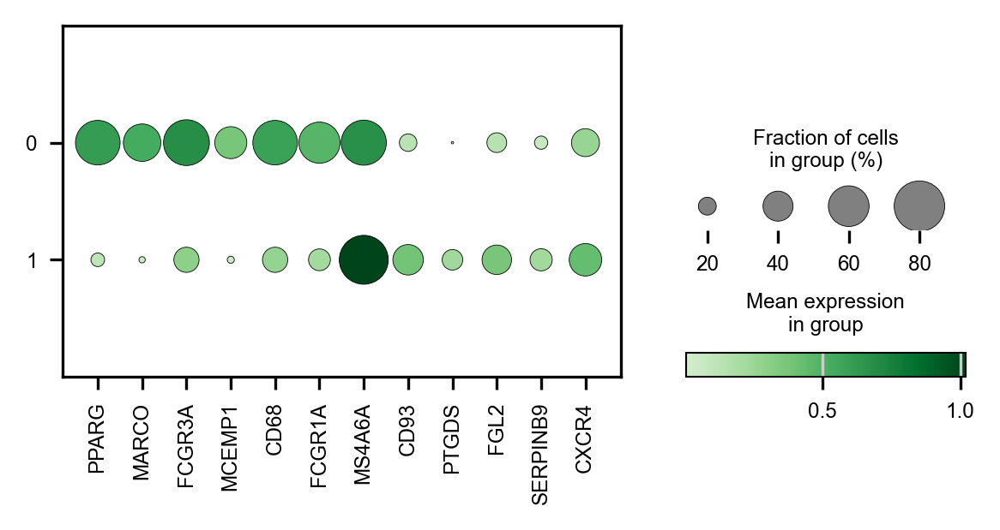

In [9]:
# DEGs analysis
subcluster_analyzer.deg_analysis_subclusters(dotplot=True)

Saving cell type labels with subcluster labels...


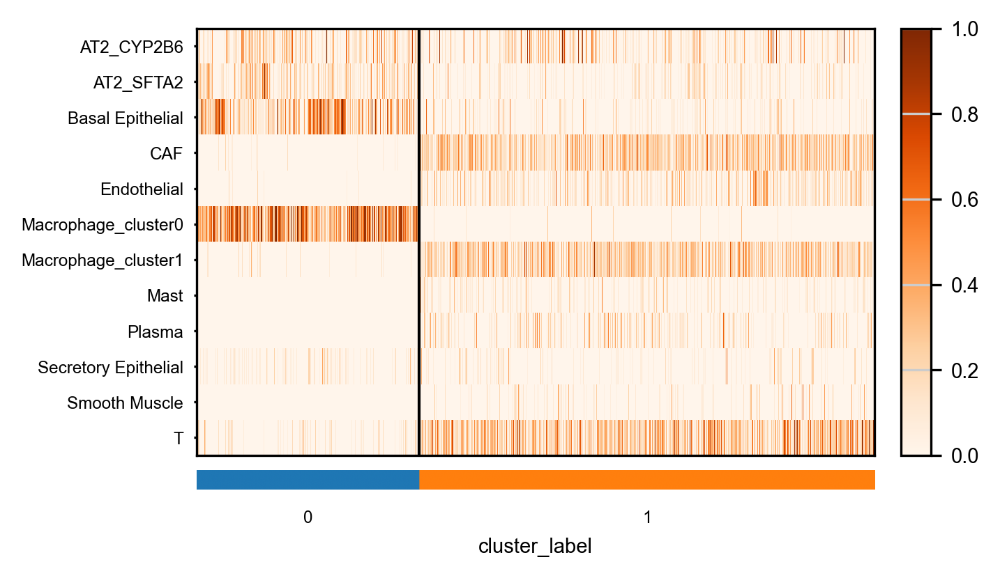

In [10]:
# Spatial neighborhood analysis
# For each cell, we calculate the proportion of different cell types within its `k` nearest neighbors.
subcluster_analyzer.neighborhood_analysis(k=10)

The generated figures and DEG analysis results have been saved in the `save_path` directory.

In [11]:
# (Optional) Save the full AnnData object
subcluster_analyzer.adata.write(save_path + runLabel + "_processed.h5ad")

# Save the AnnData object for the selected subcluster 
subcluster_analyzer.adata_selected_plot.write(save_path + runLabel + "_" + subcluster_analyzer.selected_cluster + "_subclusters.h5ad")